## Heart rate Resting/Active

<img src="heart-rate.jpg">

## Objective:

### Heart rate reprents a strong indicator of health. 
### [As a fitbit owner, some versions will also track your heart rate.](https://help.fitbit.com/articles/en_US/Help_article/1141)



### Thus with this information, we can calculate the average BPMs for your age group.
### The standard rule according to the CDC:
### [Your maximum heart rate is about 220 minus your age](https://www.heart.org/en/healthy-living/fitness/fitness-basics/target-heart-rates)


<img src = "heartdoctor.jpg">

### How quickly you return to normal resting rate is an indicator of fitness?
### According to berkleywellness.com:
## [Your heart rate drops most sharply in the first minute after you stop exercising; it should then fall about 20 beats a minute—a drop of less than 12 beats a minute is considered abnormal.](http://www.berkeleywellness.com/fitness/exercise/article/your-heart-beat-and-your-health) 


## Imports

In [150]:
import pandas as pd
import matplotlib.pyplot as plt
import plotlywrapper as pw
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import  train_test_split
import seaborn as sns
from sklearn.metrics import r2_score, mean_squared_error
from pmdarima import auto_arima
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import mean_absolute_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import AR, ARIMA, ARMA
from statsmodels.tsa.stattools import adfuller

import warnings
warnings.filterwarnings("ignore")

## Importing example Data

In [151]:
df = pd.read_csv("minute_data_march.csv")

## Droping unused columns (Calories and Intensity)

In [152]:
df.drop(columns=["Calories", "Intensity"], inplace=True)

In [153]:
df['Working'] = [1 if x != 0 else 0 for x in df['Steps']]

## Changing Date Column to index and DATETIME FMT

In [154]:
pd.ActivityMinute = pd.to_datetime(df['ActivityMinute'])

In [155]:
df.set_index(df.ActivityMinute, inplace=True)
df.index = pd.to_datetime(df.index)
df.drop(columns="ActivityMinute", inplace= True)

In [156]:
df.head()

,Id,HeartRate,Steps,Working
ActivityMinute,,,,
2016-04-01 07:54:00,2022484408,99.600000,22,1
2016-04-01 07:55:00,2022484408,110.111111,10,1
2016-04-01 07:56:00,2022484408,92.555556,27,1
2016-04-01 07:57:00,2022484408,90.400000,0,0
2016-04-01 07:58:00,2022484408,97.875000,17,1


In [157]:
df.isnull().sum()

Id           0
HeartRate    0
Steps        0
Working      0
dtype: int64

## Unique User IDs list

In [158]:
user= df.Id.unique()

In [159]:
len(user)

14

In [160]:
user

array([2022484408, 2026352035, 2347167796, 4020332650, 4558609924,
       5553957443, 5577150313, 6117666160, 6391747486, 6775888955,
       6962181067, 7007744171, 8792009665, 8877689391], dtype=int64)

## Steps vs BPM of Fitbit Users

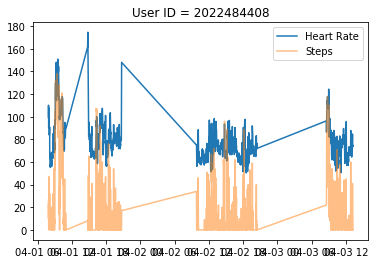

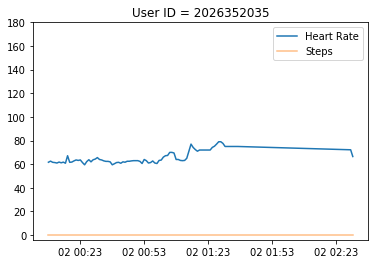

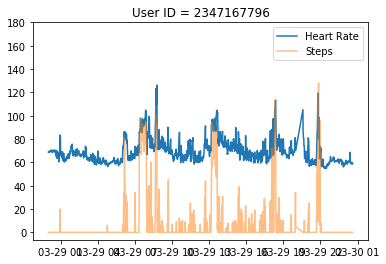

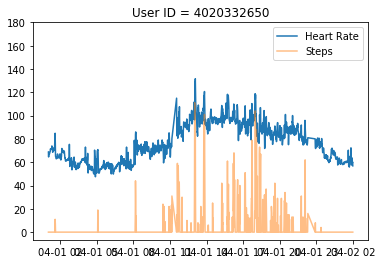

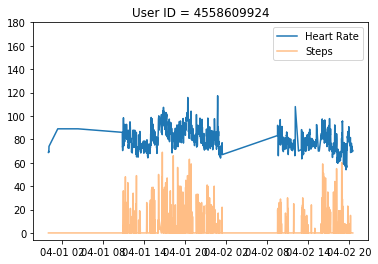

...

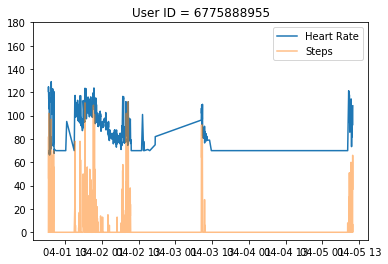

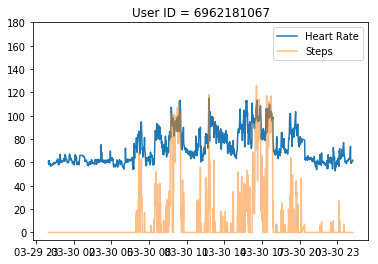

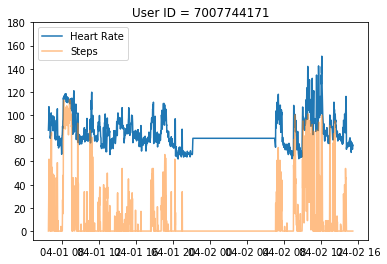

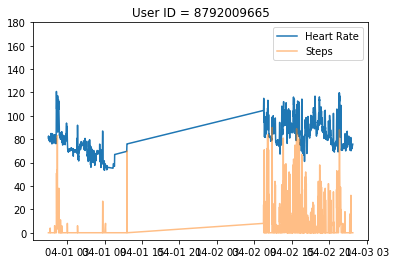

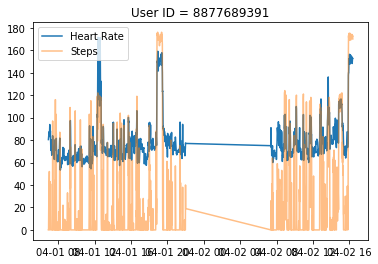

In [161]:
for x in user:
    plt.title('User ID = ' + str(x))
    plt.plot(df[df.Id == x].head(1440)['HeartRate'], label="Heart Rate")
    plt.plot(df[df.Id == x].head(1440)['Steps'], label="Steps", alpha=.5)
    plt.yticks(np.linspace(0,180,10))
    plt.legend()
    plt.show()

## Closer Inspection

In [162]:
df[(df['Id'] == 2022484408) & (df['Steps']==0)]['HeartRate'].mean()

71.42805417696783

## Heart Rate Function
### MAXIUM heart rate should be 220 BPM - your age
### Your dropping heart rate should be between 20 - 12 BPM.  
##### Citations above

In [163]:
ID = 2022484408
AGE = 35

In [164]:
DF1 = df
DF1 = DF1[0:500]

### Resting BPM calculation is when the total average of BPM when steps = 0

In [165]:
DF1['RestingBPM'] = DF1[(DF1['Id'] == ID) & (DF1['Steps']==0)]['HeartRate'].mean()

## [Maxium Heart Rate](https://www.mayoclinic.org/healthy-lifestyle/fitness/in-depth/exercise-intensity/art-20046887)

In [166]:
DF1['MaxRate'] = 220 - AGE

## Heart Rate Reserve (Target)

In [167]:
DF1['HRR'] = DF1['MaxRate'] - DF1['RestingBPM']

## Low rate for moderate exercise

In [168]:
DF1['HRRlow'] = (DF1['MaxRate'] * .5 ) 

## High Rate for Target Exercise

In [169]:
DF1['HRRhigh'] = (DF1['HRR'] * .85) + DF1.RestingBPM

In [170]:
DF1.head()

,Id,HeartRate,Steps,Working,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh
ActivityMinute,,,,,,,,,
2016-04-01 07:54:00,2022484408,99.600000,22,1,74.467196,185,110.532804,92.5,168.420079
2016-04-01 07:55:00,2022484408,110.111111,10,1,74.467196,185,110.532804,92.5,168.420079
2016-04-01 07:56:00,2022484408,92.555556,27,1,74.467196,185,110.532804,92.5,168.420079
2016-04-01 07:57:00,2022484408,90.400000,0,0,74.467196,185,110.532804,92.5,168.420079
2016-04-01 07:58:00,2022484408,97.875000,17,1,74.467196,185,110.532804,92.5,168.420079


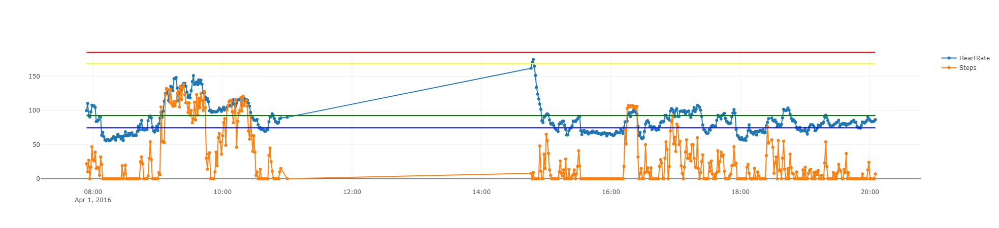

Chart({
    'data': [{'marker': {'size': 6},
              'mode': 'lines+markers',
              'name': 'HeartRate',
              'text': '',
              'type': 'scatter',
              'uid': 'bae57b1e-1638-4767-8dcd-e93432be6adf',
              'x': array(['2016-04-01T07:54:00', '2016-04-01T07:55:00', '2016-04-01T07:56:00',
                          ..., '2016-04-01T20:03:00', '2016-04-01T20:04:00',
                          '2016-04-01T20:05:00'], dtype=object),
              'y': array([ 99.6       , 110.11111111,  92.55555556, ...,  83.66666667,
                           84.57142857,  86.5       ]),
              'yaxis': 'y'},
             {'marker': {'size': 6},
              'mode': 'lines+markers',
              'name': 'Steps',
              'text': '',
              'type': 'scatter',
              'uid': '04b6e2fd-6ca3-4f06-aae6-9334a71e0dc1',
              'x': array(['2016-04-01T07:54:00', '2016-04-01T07:55:00', '2016-04-01T07:56:00',
                          ...,

In [171]:
ID = 2022484408
fig1 = pw.line(DF1[DF1.Id==ID].index, DF1[DF1.Id==ID]['HeartRate'], label="HeartRate")
fig1 += pw.line(DF1[DF1.Id==ID].index, DF1[DF1.Id==ID]['Steps'], label="Steps")
fig1 += pw.horizontal(xmin=DF1[DF1.Id==ID].index[0], xmax=DF1[DF1.Id==ID].index[-1], y=DF1[(DF1['Id'] == ID) & (DF1['Steps']==0)]['HeartRate'].mean(), color="blue")
fig1 += pw.horizontal(xmin=DF1[DF1.Id==ID].index[0], xmax=DF1[DF1.Id==ID].index[-1], y=(220-AGE), color="red")
fig1 += pw.horizontal(xmin=DF1[DF1.Id==ID].index[0], xmax=DF1[DF1.Id==ID].index[-1], y=DF1['HRRhigh'][1], color="yellow")
fig1 += pw.horizontal(xmin=DF1[DF1.Id==ID].index[0], xmax=DF1[DF1.Id==ID].index[-1], y=DF1['HRRlow'][1], color="green")
fig1

## Determines Average Cooldowm BPM
## Healthy is around 20. "Abnormal" (Not bad) is around 12

In [172]:
ID = 2022484408
AGE = 35

## Imports CSV

In [173]:
df = pd.read_csv("minute_data_march.csv")

## Dataframe cleaning

In [174]:
DF1 = df[df['Id'] == ID]
DF1['RestingBPM'] = DF1[(DF1['Id'] == ID) & (DF1['Steps']==0)]['HeartRate'].mean()
DF1['MaxRate'] = 220 - AGE
DF1['HRR'] = DF1['MaxRate'] - DF1['RestingBPM']
DF1['HRRlow'] = (DF1['MaxRate'] * .5 ) 
DF1['HRRhigh'] = (DF1['HRR'] * .85) + DF1.RestingBPM
DF1.head()

,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh
0,2022484408,4/1/2016 7:54:00 AM,3.73572,99.600000,22,1,71.428054,185,113.571946,92.5,167.964208
1,2022484408,4/1/2016 7:55:00 AM,4.15080,110.111111,10,1,71.428054,185,113.571946,92.5,167.964208
2,2022484408,4/1/2016 7:56:00 AM,5.18850,92.555556,27,1,71.428054,185,113.571946,92.5,167.964208
3,2022484408,4/1/2016 7:57:00 AM,1.34901,90.400000,0,0,71.428054,185,113.571946,92.5,167.964208
4,2022484408,4/1/2016 7:58:00 AM,3.32064,97.875000,17,1,71.428054,185,113.571946,92.5,167.964208


## Dummy Variable Exercise

In [175]:
DF1['Exercise'] = [0] * len(DF1.HeartRate)
for i in range(len(DF1.HeartRate)):
        if DF1['HeartRate'].iloc[i] > DF1['HRRlow'].iloc[i]:
            DF1.loc[DF1.index[i],'Exercise'] = 1

In [176]:
DF1.head(5)

,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh,Exercise
0,2022484408,4/1/2016 7:54:00 AM,3.73572,99.600000,22,1,71.428054,185,113.571946,92.5,167.964208,1
1,2022484408,4/1/2016 7:55:00 AM,4.15080,110.111111,10,1,71.428054,185,113.571946,92.5,167.964208,1
2,2022484408,4/1/2016 7:56:00 AM,5.18850,92.555556,27,1,71.428054,185,113.571946,92.5,167.964208,1
3,2022484408,4/1/2016 7:57:00 AM,1.34901,90.400000,0,0,71.428054,185,113.571946,92.5,167.964208,0
4,2022484408,4/1/2016 7:58:00 AM,3.32064,97.875000,17,1,71.428054,185,113.571946,92.5,167.964208,1


## Creates Cooldown variabels based on periods of 5

In [177]:
DF1['CoolDown'] = [0] * len(DF1.Exercise)
for i in range(len(DF1.Exercise)):
        if ((sum(DF1.Exercise[i-4:i+1]) == 5) & (sum(DF1.Exercise[i+1:i+6]) == 0)):
            while DF1.Steps.iloc[i] > 0:
                DF1['CoolDown'].iloc[i] = 1
                i += 1
            i  = i - 1

In [178]:
DF1.loc[131066:131110,:]

,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh,Exercise,CoolDown


In [179]:
DF1[DF1.CoolDown == 1].head(5)

,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh,Exercise,CoolDown
8,2022484408,4/1/2016 8:02:00 AM,5.18850,104.375000,39,1,71.428054,185,113.571946,92.5,167.964208,1,1
9,2022484408,4/1/2016 8:03:00 AM,4.98096,83.777778,15,1,71.428054,185,113.571946,92.5,167.964208,0,1
10,2022484408,4/1/2016 8:04:00 AM,3.11310,84.200000,17,1,71.428054,185,113.571946,92.5,167.964208,0,1
11,2022484408,4/1/2016 8:05:00 AM,3.11310,86.166667,16,1,71.428054,185,113.571946,92.5,167.964208,0,1
12,2022484408,4/1/2016 8:06:00 AM,2.90556,91.000000,5,1,71.428054,185,113.571946,92.5,167.964208,0,1


## Creates Average cooldown BPM 

In [180]:
cooldown_avgs = []
for i in range(len(DF1.CoolDown)):
        if ((DF1.CoolDown.iloc[i] == 1) & (DF1.CoolDown.iloc[i-1] == 0)):
            if DF1.CoolDown.iloc[i+1] == 0:
                avg_decr = DF1.HeartRate.iloc[i] - DF1.HeartRate.iloc[i+1]
            else:
                decreases = []
                while ((DF1.CoolDown.iloc[i] == 1) & (DF1.CoolDown.iloc[i+1] == 1)):
                    decr = DF1.HeartRate.iloc[i] - DF1.HeartRate.iloc[i+1]
                    decreases.append(decr)
                    i += 1
                avg_decr = np.mean(decreases)
            cooldown_avgs.append(avg_decr)
            i  = i - 1
print('avg:', np.mean(cooldown_avgs))

avg: 11.920116632465659


## Average Cooldown Length (In Minutes) - Shorter is better

In [190]:
count = 0
cooldown_lengths = []
for i in range(len(DF1.CoolDown)):
       if ((DF1.CoolDown.iloc[i] == 1) & (DF1.CoolDown.iloc[i-1] == 0)):
           count = 0
           while (DF1.CoolDown.iloc[i] == 1):
               count += 1
               i += 1
           cooldown_lengths.append(count)
           i  = i - 1
print('Average Cooldown Length (min):', np.mean(cooldown_lengths))

Average Cooldown Length (min): 4.6571428571428575


In [181]:
DF1.head()

,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh,Exercise,CoolDown
0,2022484408,4/1/2016 7:54:00 AM,3.73572,99.600000,22,1,71.428054,185,113.571946,92.5,167.964208,1,0
1,2022484408,4/1/2016 7:55:00 AM,4.15080,110.111111,10,1,71.428054,185,113.571946,92.5,167.964208,1,0
2,2022484408,4/1/2016 7:56:00 AM,5.18850,92.555556,27,1,71.428054,185,113.571946,92.5,167.964208,1,0
3,2022484408,4/1/2016 7:57:00 AM,1.34901,90.400000,0,0,71.428054,185,113.571946,92.5,167.964208,0,0
4,2022484408,4/1/2016 7:58:00 AM,3.32064,97.875000,17,1,71.428054,185,113.571946,92.5,167.964208,1,0


## Graphing Cooldown BPM

In [182]:
ID = 2022484408
AGE = 35
LEN = 600

In [183]:
DF1['CoolBPM'] = DF1['HeartRate'] * DF1['CoolDown']
DF1.head()


,Id,ActivityMinute,Calories,HeartRate,Steps,Intensity,RestingBPM,MaxRate,HRR,HRRlow,HRRhigh,Exercise,CoolDown,CoolBPM
0,2022484408,4/1/2016 7:54:00 AM,3.73572,99.600000,22,1,71.428054,185,113.571946,92.5,167.964208,1,0,0.0
1,2022484408,4/1/2016 7:55:00 AM,4.15080,110.111111,10,1,71.428054,185,113.571946,92.5,167.964208,1,0,0.0
2,2022484408,4/1/2016 7:56:00 AM,5.18850,92.555556,27,1,71.428054,185,113.571946,92.5,167.964208,1,0,0.0
3,2022484408,4/1/2016 7:57:00 AM,1.34901,90.400000,0,0,71.428054,185,113.571946,92.5,167.964208,0,0,0.0
4,2022484408,4/1/2016 7:58:00 AM,3.32064,97.875000,17,1,71.428054,185,113.571946,92.5,167.964208,1,0,0.0


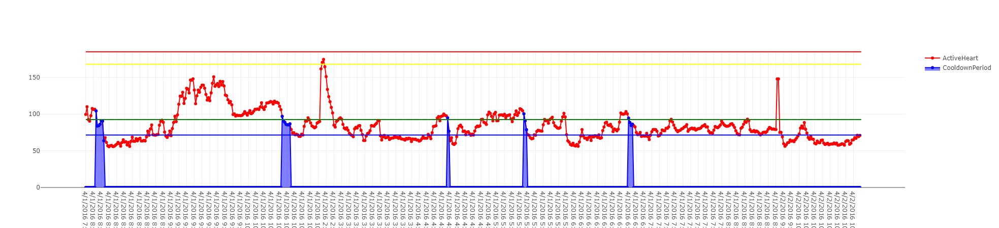

Chart({
    'data': [{'line': {'color': 'red'},
              'marker': {'size': 6},
              'mode': 'lines+markers',
              'name': 'ActiveHeart',
              'text': '',
              'type': 'scatter',
              'uid': 'b33ddaff-8206-4a9f-a8f0-46e9baf802fb',
              'x': array(['4/1/2016 7:54:00 AM', '4/1/2016 7:55:00 AM', '4/1/2016 7:56:00 AM',
                          ..., '4/2/2016 10:49:00 AM', '4/2/2016 10:50:00 AM',
                          '4/2/2016 10:51:00 AM'], dtype=object),
              'y': array([ 99.6       , 110.11111111,  92.55555556, ...,  71.2       ,
                           69.33333333,  71.        ]),
              'yaxis': 'y'},
             {'fill': 'tozeroy',
              'line': {'color': 'blue'},
              'marker': {'size': 6},
              'mode': 'lines+markers',
              'name': 'CooldownPeriod',
              'text': '',
              'type': 'scatter',
              'uid': '296329fd-a003-446d-8c83-a1dae140f6ed

In [184]:
figcool = pw.line(DF1[DF1.Id==ID].ActivityMinute[:LEN], DF1[DF1.Id==ID]['HeartRate'][:LEN], label="ActiveHeart", color='red')
figcool += pw.fill_zero(DF1[DF1.Id==ID].ActivityMinute[:LEN], DF1[(DF1.Id==ID) ]['CoolBPM'][:LEN], label="CooldownPeriod", color='blue')
figcool += pw.horizontal(xmin=DF1[DF1.Id==ID].ActivityMinute[0], xmax=DF1[DF1.Id==ID].index[(LEN)], y=DF1[(DF1['Id'] == ID) & (DF1['Steps']==0)]['HeartRate'].mean(), color="blue")
figcool += pw.horizontal(xmin=DF1[DF1.Id==ID].ActivityMinute[0], xmax=DF1[DF1.Id==ID].index[LEN], y=(220-AGE), color="red")
figcool += pw.horizontal(xmin=DF1[DF1.Id==ID].ActivityMinute[0], xmax=DF1[DF1.Id==ID].index[LEN], y=DF1['HRRhigh'][1], color="yellow")
figcool += pw.horizontal(xmin=DF1[DF1.Id==ID].ActivityMinute[0], xmax=DF1[DF1.Id==ID].index[LEN], y=DF1['HRRlow'][1], color="green")
figcool